# Objectives

1. What are **NoSQL databases** ? What are their use cases ?
2. How to interact with MongoDB ?
3. Pymongo python package
4. MongoDB basic commands
5. Example 1: toy data on cars
6. Example 2: project;

# Warm-up

**in groups of 2-3 people, reserach for 15 mins and try to answer the following:**

1. What are the main differences between SQL and NoSQL databases ? relational and non-relational databases ?
2. What are some use cases for NoSQL databases ?

## 1. What are NoSQL databases ? What are their use cases ?

### A:

1. What are the main differences between SQL and NoSQL databases ?

**SQL Databases**

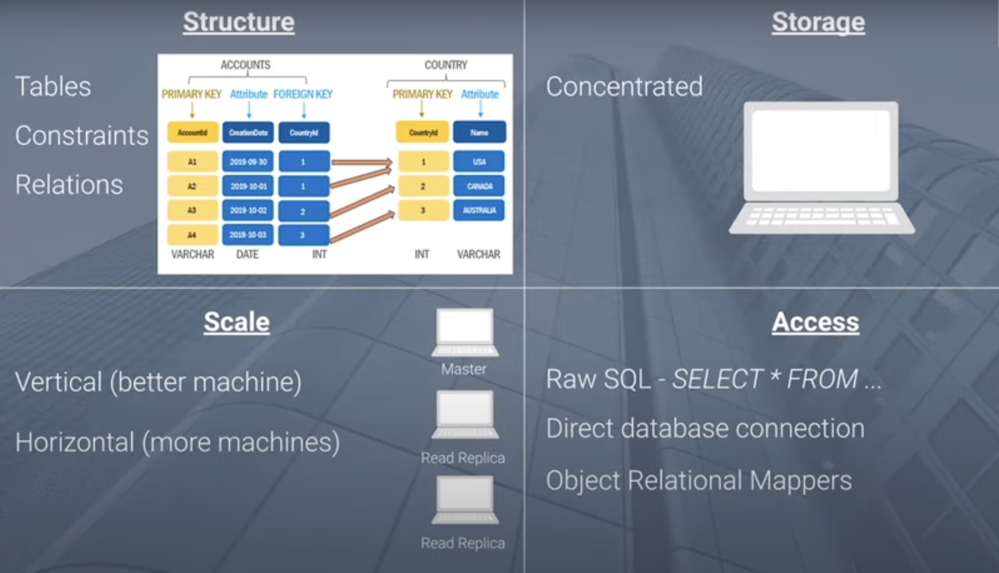

**NOSQL Databases**

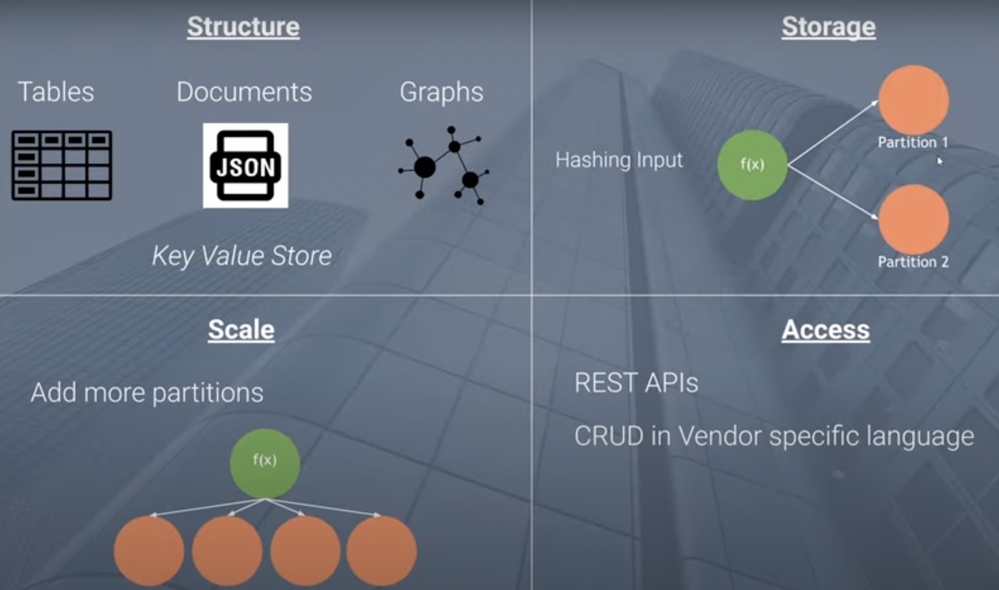

[source](https://www.youtube.com/watch?v=-56x56UppqQ&t=745s)

2. What are some use cases for NoSQL databases ? 

**use SQL databases when:**

- when you want to use flexible queries to access your data
- when you want to often use queries that span mutliple tables
- when you want to enforce certain constraints on your data
- when you want to use well documented access language (SQL is ISO standardized)
- examples: PostgresSQL, Mysql, 


**use NoSQL databases when:**

- when your access patterns are known beforehand and simple
- when data model fits (facebook connections graph)
- when you need flexible data storage/need to avoid constraints (NoSQL databases are **schemaless**)
- when you need low latency and easy horizontal scaling (ex: Apple has a 75,000-server NOSQL database!)
- examples: Cassandra, MongoDB, HBase, DynamoDB

## 2. How to interact with MongoDB ?

### 2.1 Install MongoDB locally

[instructions for local installation](https://docs.mongodb.com/manual/installation/)

### 2.2 Use Docker

**Important Note:** because I have both a local installation of MongoDB and a container running MongoDB, I have to change the port used for the container to 27027 instead of the default 27017

*docker run --name mymon -it -d -p 27027:27017 mongo*

*docker exec -it mymon mongo*

## 3. pymongo python package

In [7]:
pip install pymongo

Note: you may need to restart the kernel to use updated packages.


In [8]:
import pymongo


In [9]:
# mongo stores data in the form JSON files. JSON files are very similar to python dictionaries

# A list of dictionaries about cars as I percieve cars

# list of python dictionaries
# each python dictionary in the list is a row/record in the mongo collection
# each record does not need to have the same elements as the other records

cars = [ {'color': 'black', 'size' : 'rather big', 'type' : 'sports' , 'price': 20000},
    {'color': 'red', 'size' : 'small', 'status': 'new', 'price': 12000},
    {'color': 'grey', 'status' : 'used' ,'price': 9000},
    {'color': 'white', 'price': 29000, 'brand':'bmw'},
    {'color': 'blue', 'status': 'new', 'price': 350000},
    {'color': 'green', 'price': 21000, 'brand':'vw'},
    {'color': 'purple', 'price': 41400, 'status':'new'}]

### 3.1 Connect to local MongoDB

In [10]:
client = pymongo.MongoClient() # creating the connection
db = client.testdb  # creating a new local mongo db

In [11]:
# list database names
client.list_database_names()

['admin', 'config', 'local']

In [12]:
# list collections inside my current database
client.testdb.list_collection_names()

[]

In [13]:
db.name

'testdb'

In [14]:
client.name

Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'name')

### 3.2 Connect to MongoDB running in a Docker container

In [15]:
# creating the connection, I need the ip and the port number

client_docker = pymongo.MongoClient("0.0.0.0:27027") 

# creating a new mongo database in the docker container mongo
db = client_docker.mynewdb


In [16]:
# to check 

db.name

'mynewdb'

In [23]:
client_docker.name

Database(MongoClient(host=['0.0.0.0:27027'], document_class=dict, tz_aware=False, connect=True), 'name')

In [25]:
client_docker.list_database_names()

ServerSelectionTimeoutError: 0.0.0.0:27027: [WinError 10049] Die angeforderte Adresse ist in diesem Kontext ungültig, Timeout: 30s, Topology Description: <TopologyDescription id: 61e7ec122e6b6c50f23b273d, topology_type: Unknown, servers: [<ServerDescription ('0.0.0.0', 27027) server_type: Unknown, rtt: None, error=AutoReconnect('0.0.0.0:27027: [WinError 10049] Die angeforderte Adresse ist in diesem Kontext ungültig')>]>

**Note:** a newly created DB that is empty still will NOT show until it has been populated

## 4. MongoDB basic commands

### 4.1 Create a new Collection and insert data

In [ ]:

# data is inserted in the form of a python dictionary
neighbour_car = {'name':'big car outside campus', 
                 'size':'big', 'color': 'black'}

# creating a new collection called cars
db.cars.insert_one(neighbour_car)  

In [ ]:
# insering another row, since we do not have columns, data elements
# in each row do not need to match!!

db.cars.insert_one({'name':'That Porsche', 
                    'size':'normal', 'price': 'very expensive'})

In [ ]:
client_docker.list_database_names()

In [ ]:
# examine contents of a collection

db.cars.find()

In [ ]:
for document in db.cars.find():
    print(document)

In [ ]:
# insert the dictionary all at once 

db.cars.insert_many(cars)

In [ ]:
for document in db.cars.find():
    print(document)

### 4.2 Dropping a Collection

In [ ]:
db.cars.drop()

In [ ]:
db.list_collection_names()

In [ ]:
db.name

In [ ]:
# re-insert the data

db.cars.insert_many(cars)

In [ ]:
for document in db.cars.find():
    print(document)

### 4.3 Sorting and Limiting

In [ ]:
for document in db.cars.find().sort('price', -1):
    print(document)

In [ ]:
for document in db.cars.find().sort('_id', -1):
    print(document)

In [ ]:
# sorting with multiple fields
# -1 == DESCENDING, 1 == ASCENDING

for document in db.cars.find().sort([('price', -1), ('color', 1)]):
    print(document)

In [ ]:
for document in db.cars.find().sort('_id').limit(3):
    print(document)

### 4.4 Filtering by Conditions

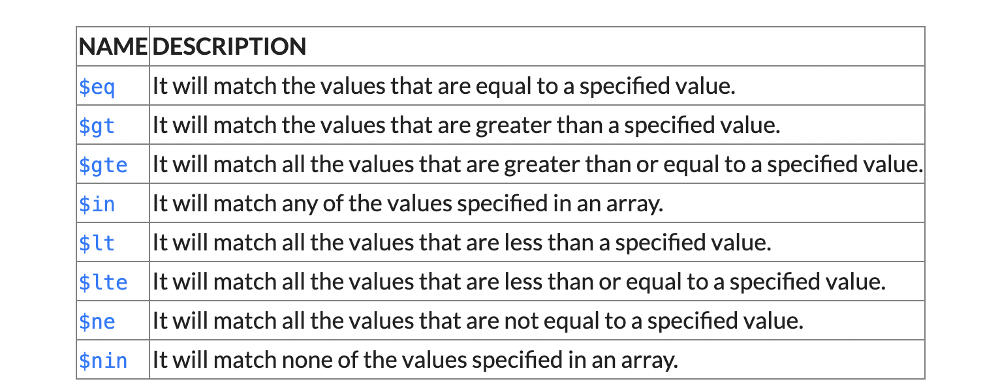
[source](https://www.analyticsvidhya.com/blog/2020/08/query-a-mongodb-database-using-pymongo/)

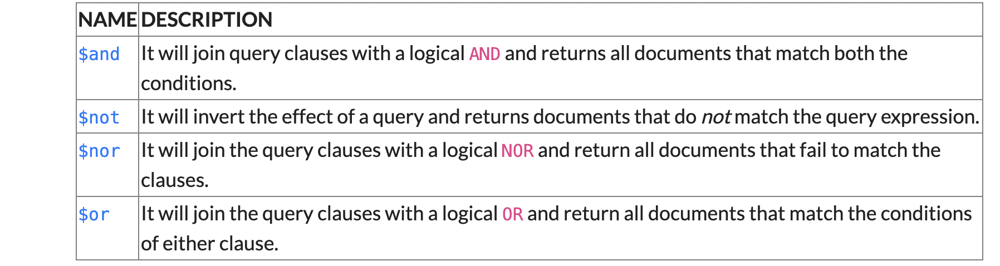

In [ ]:
query_1 = db.cars.find({
    "status" : { "$eq" : 'new'},
    "price" : { "$gt" : 15000}
})

for i in query_1:
    print(i)

In [ ]:
query_2 = db.cars.find({
    "color" : { "$in" : [ 'black', 'blue'] }
})

for i in query_2:
    print(i)

In [ ]:
query_3 = db.cars.find({
    "price" : { "$lt" : 25000, "$gt" : 15000}
})

for i in query_3:
    print(i)

In [ ]:
query_4 = db.cars.find({
    "$and" : [{
                 "color" : { "$in" : [ 'black', 'blue']}
              },
              {
                   "price" : { "$ne" : 350000}
              }]
})

for i in query_4:
    print(i)